## Plane Wavefunction Circuits
- Generate Plane wavefunction circuits for a given lattice using fourier state preparation.

We aim to generate a quantum circuit that prepares a plane wavefunction for a given lattice. The plane wavefunction is given by:

$$\Psi(\mathbf{r}) = \sum_{\mathbf{k}} c_{\mathbf{k}} e^{i \pi \mathbf{k} \cdot \mathbf{r}}$$

To obtain the coefficients $c_{\mathbf{k}}$, we solve a lattice hamiltonian in this finite basis. The lattice hamiltonian is given by:

$$ H_{\mathbf{k}, \mathbf{k}'} = -\frac{\hbar^2 \mathbf{k}^2}{2m} - \sum_{\mathbf{r}} \frac{4 \pi}{V \cdot |\mathbf{k}' - \mathbf{k}|^2} e^{-i (\mathbf{k}' - \mathbf{k}) \cdot \mathbf{r}} $$

This solution is then used to build the single particl plane wave function in the periodic lattice in real space.

In [70]:
from mvsp.applications.chemistry.lattices import center, sc, bcc, fcc
from mvsp.applications.chemistry import plane_wave_hamiltonian, plane_wave
import numpy as np
import itertools

- Set k dim

In [51]:
k_neg = 4
k_min = -k_neg
k_max = k_neg-1
ks = np.arange(k_min, k_max+1)
k_dim = len(ks)
k_point_grid = list(itertools.product(ks, ks, ks))
k_point_grid_array = [np.array(k) for k in k_point_grid]

cell_length = 1.0
cell_volume = cell_length**3


- Choose the lattice

In [52]:
fcc_lattice = fcc(cell_length)

- Generate hamiltonian solutions in k basis

In [54]:
H = plane_wave_hamiltonian(k_point_grid_array, cell_volume, fcc_lattice)

e,c = np.linalg.eig(H)

coeffs = []
for i in range(len(e)):
    coeffs.append({k: coeff for k, coeff in zip(k_point_grid, c[i])})

print(coeffs) 

[{(-4, -4, -4): (-0.00284751874411746+0.01320488994803112j), (-4, -4, -3): (0.0042493692037612755-0.05992213965281511j), (-4, -4, -2): (3.687835117243765e-16+5.894747478587883e-16j), (-4, -4, -1): (0.007795983895708158-0.10993444281476428j), (-4, -4, 0): (-1.9383316122685439e-16+6.105554681235842e-17j), (-4, -4, 1): (0.09238583295096767+0.04178755895429782j), (-4, -4, 2): (-3.9023678911341145e-16-8.283419467547405e-16j), (-4, -4, 3): (0.134705595147608+0j), (-4, -3, -4): (3.51797667726709e-17-7.188250795252832e-16j), (-4, -3, -3): (0.29755688533915087+0j), (-4, -3, -2): (1.3372368675208015e-15+1.4595133986286603e-15j), (-4, -3, -1): (0.2814291574671714+0j), (-4, -3, 0): (3.620538551022715e-16+2.213910267150688e-16j), (-4, -3, 1): (-1.0477423453101883e-15+7.548548499469141e-16j), (-4, -3, 2): (9.20713283016503e-16-5.540829902122612e-16j), (-4, -3, 3): (-1.0107673509666494e-15+3.0330524450677444e-15j), (-4, -2, -4): (0.4423599776395158+0j), (-4, -2, -3): (3.1418564912280825e-16-3.6957506

- Generate real space dimension

In [55]:
n_space_qubits = 5
space_dim = 2**n_space_qubits
num_points = space_dim
L =1
xs = np.linspace(0,L, num_points)
ys = np.linspace(0,L, num_points)
zs = np.linspace(0,L, num_points)
X, Y, Z = np.meshgrid(xs, ys, zs)
R = np.stack((X, Y, Z), axis = -1)
R.shape


(32, 32, 32, 3)

In [56]:
from mvsp.circuits.lcu_state_preparation import FourierBlockEncoding
from mvsp.circuits.lcu_state_preparation import LCUStatePreparationBox

dims_variables = (space_dim,space_dim,space_dim)
n_qubits = [
    int(np.ceil(np.log2(d))) for d in dims_variables
]

- Generate the wavefunction using the fourier state preparation circuit

In [57]:
from mvsp.circuits.lcu_state_preparation import FourierBlockEncoding
from mvsp.circuits.lcu_state_preparation import LCUStatePreparationBox

space_dims = (space_dim,space_dim,space_dim)
n_qubits = [
    int(np.ceil(np.log2(d))) for d in dims_variables
]

state = c[0]
coeffs_array = state.reshape((k_dim,k_dim, k_dim))
coeffs_array = np.swapaxes(coeffs_array, 0, -1)
coeff_t = np.transpose(coeffs_array, (1, 2, 0))

lcuspbox = LCUStatePreparationBox(
        coeff_t,
        [FourierBlockEncoding(n) for n in n_qubits],
        min_basis_indices=[k_min,k_min,k_min],
    )
lcuspbox.get_circuit().n_qubits

24

In [58]:
from pytket.circuit.display import render_circuit_jupyter
render_circuit_jupyter(lcuspbox.get_circuit())

- Compile circuit to backend

In [59]:
from pytket.extensions.qiskit import AerStateBackend
backend = AerStateBackend()
circ_compiled = backend.get_compiled_circuit(lcuspbox.get_circuit().copy(), optimisation_level=0)
print('2Q gates: ',circ_compiled.n_2qb_gates())
print('N Gates: ',circ_compiled.n_gates)
print('depth: ',circ_compiled.depth())
print('depth 2q: ',circ_compiled.depth_2q())
print('n_qubits: ',circ_compiled.n_qubits)


2Q gates:  1620
N Gates:  3324
depth:  3006
depth 2q:  1509
n_qubits:  24


- post select vector

In [60]:
from mvsp.measurement import recursive_statevector_postselect

vec = backend.run_circuit(circ_compiled).get_state()
vec_projected = recursive_statevector_postselect(circ_compiled.qubits, vec, lcuspbox.postselect.copy())

- rescale the post selected vector

In [61]:
success_probability = np.linalg.norm(vec_projected)**2
print("Success probability: ", success_probability)

vec_projected_scaled = vec_projected
res = vec_projected_scaled.reshape(dims_variables)
res_circ = res / np.linalg.norm(res)


Success probability:  0.0604046000849688


- Plot the post selected vector in 3D real space

In [66]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import ticker

def plot_real_space(res):

    fig = plt.figure()
    ax2 = fig.add_subplot(111, projection='3d')

    # Create scatter plot
    scatter2 = ax2.scatter(X, Y, Z, c=res.flatten(), cmap="RdBu_r")
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('FCC Lattice Wavefunction')

    # Create colorbar
    cax = fig.add_axes([0.85, 0.1, 0.03, 0.8])  # Position for colorbar
    cbar = plt.colorbar(scatter2, cax=cax, aspect=2, format=ticker.FuncFormatter(lambda x, pos: f'{x * 1e4:.0f}'))
    cax.set_title(r'   $\times 10^{-4}$')
    cbar.set_label(r'$\Psi(\mathbf{r})$', rotation=0, labelpad=10)

    plt.show()

- Circuit Lattice Wavefunction

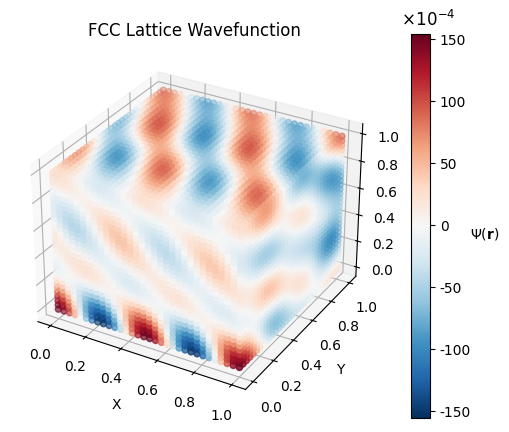

In [67]:
plot_real_space(res_circ)

- Numpy Lattice Wavefunction 

{(-4, -4, -4): (-0.00284751874411746+0.01320488994803112j), (-4, -4, -3): (0.0042493692037612755-0.05992213965281511j), (-4, -4, -2): (3.687835117243765e-16+5.894747478587883e-16j), (-4, -4, -1): (0.007795983895708158-0.10993444281476428j), (-4, -4, 0): (-1.9383316122685439e-16+6.105554681235842e-17j), (-4, -4, 1): (0.09238583295096767+0.04178755895429782j), (-4, -4, 2): (-3.9023678911341145e-16-8.283419467547405e-16j), (-4, -4, 3): (0.134705595147608+0j), (-4, -3, -4): (3.51797667726709e-17-7.188250795252832e-16j), (-4, -3, -3): (0.29755688533915087+0j), (-4, -3, -2): (1.3372368675208015e-15+1.4595133986286603e-15j), (-4, -3, -1): (0.2814291574671714+0j), (-4, -3, 0): (3.620538551022715e-16+2.213910267150688e-16j), (-4, -3, 1): (-1.0477423453101883e-15+7.548548499469141e-16j), (-4, -3, 2): (9.20713283016503e-16-5.540829902122612e-16j), (-4, -3, 3): (-1.0107673509666494e-15+3.0330524450677444e-15j), (-4, -2, -4): (0.4423599776395158+0j), (-4, -2, -3): (3.1418564912280825e-16-3.69575064

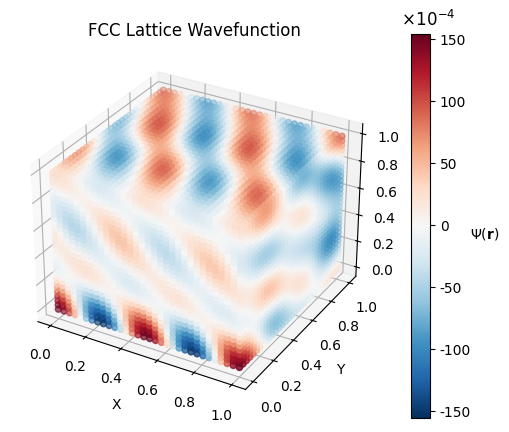

In [68]:
from mvsp.applications.chemistry import plane_wave_renorm
state = coeffs[0]
print(state)
pw_3d = plane_wave(state) 
pw_3d_r = pw_3d(R)
pw_3d_renorm = plane_wave_renorm(pw_3d_r)

plot_real_space(pw_3d_renorm)